In [1]:
!pip install ucimlrepo
!pip install xmltodict
import pandas as pd
import polars as pl
import duckdb as db
import numpy as np
import scipy.stats as st

from ucimlrepo import fetch_ucirepo
from sklearn.datasets import load_digits

import matplotlib.pyplot as plt

from urllib.request import urlopen
import xmltodict
import time

# HW2

Overall rules:

- Do not split your answers into separate files. All answers must be in a single jupyter notebook.
- Refrain from downloading and loading data from a local file unless specifically specified. Obtain all required remote data using the appropriate API.
- Refrain from cleaning data by hand on a spreadsheet. All cleaning must be done programmatically, with each step explained. This is so that I can replicate the procedure deterministically.
- Refrain from using code comments to explain what has been done. Document your steps by writing appropriate markdown cells in your notebook.
- Avoid duplicating code by copying and pasting it from one cell to another. If copying and pasting is necessary, develop a suitable function for the task at hand and call that function.
- When providing parameters to a function, never use global variables. Instead, always pass parameters explicitly and always make use of local variables.
- Document your use of LLM models (ChatGPT, Claude, Code Pilot etc). Either take screenshots of your steps and include them with this notebook, or give me a full log (both questions and answers) in a markdown file named HW2-LLM-LOG.md.

Failure to adhere to these guidelines will result in a 15-point deduction for each infraction.

## Atabey's Comments

- Q1: Good try. I may not agree with some of the methods, but ok. Missing cross-validation. 40/100
- Q2: Confused, but you're trying. Good work. Missing error analysis following cross-validation. 80/100
- Q3: Not much. 10/100
- Q4: Very good. Except for the fact that again you didn't do an error analysis. 90/100

## Q1

For this question we are going to use [RT-IoT2022](https://archive.ics.uci.edu/dataset/942/rt-iot2022) dataset from [UCI](https://archive.ics.uci.edu/). We have seen several clustering algorithms, and also some measures of quality for clusters in the lectures. Use all you have learned and compare the clustering algorithms we have learnt using the quality measures we have seen in the class.  You must write a detailed comparison analysis to evaluate which model behaves better based on the results you will obtain. One part of your analysis should also include how much time it takes to train and run the models.

In [ ]:


rt_iot2022 = fetch_ucirepo(id=942)

X = rt_iot2022.data.features
y = rt_iot2022.data.targets

In [ ]:
X

,id.orig_p,id.resp_p,proto,service,flow_duration,fwd_pkts_tot,bwd_pkts_tot,fwd_data_pkts_tot,bwd_data_pkts_tot,fwd_pkts_per_sec,...,active.avg,active.std,idle.min,idle.max,idle.tot,idle.avg,idle.std,fwd_init_window_size,bwd_init_window_size,fwd_last_window_size
0,38667,1883,tcp,mqtt,32.011598,9,5,3,3,0.281148,...,2.282415e+06,0.0,29729182.96,29729182.96,29729182.96,29729182.96,0.0,64240,26847,502
1,51143,1883,tcp,mqtt,31.883584,9,5,3,3,0.282277,...,2.028307e+06,0.0,29855277.06,29855277.06,29855277.06,29855277.06,0.0,64240,26847,502
2,44761,1883,tcp,mqtt,32.124053,9,5,3,3,0.280164,...,2.281904e+06,0.0,29842149.02,29842149.02,29842149.02,29842149.02,0.0,64240,26847,502
3,60893,1883,tcp,mqtt,31.961063,9,5,3,3,0.281593,...,2.047288e+06,0.0,29913774.97,29913774.97,29913774.97,29913774.97,0.0,64240,26847,502
4,51087,1883,tcp,mqtt,31.902362,9,5,3,3,0.282111,...,2.087657e+06,0.0,29814704.90,29814704.90,29814704.90,29814704.90,0.0,64240,26847,502
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
123112,59247,63331,tcp,-,0.000006,1,1,0,0,167772.160000,...,5.960464e+00,0.0,0.00,0.00,0.00,0.00,0.0,1024,0,1024
123113,59247,64623,tcp,-,0.000007,1,1,0,0,144631.172400,...,6.914139e+00,0.0,0.00,0.00,0.00,0.00,0.0,1024,0,1024
123114,59247,64680,tcp,-,0.000006,1,1,0,0,167772.160000,...,5.960464e+00,0.0,0.00,0.00,0.00,0.00,0.0,1024,0,1024
123115,59247,65000,tcp,-,0.000006,1,1,0,0,167772.160000,...,5.960464e+00,0.0,0.00,0.00,0.00,0.00,0.0,1024,0,1024


In [ ]:
y

,Attack_type
0,MQTT_Publish
1,MQTT_Publish
2,MQTT_Publish
3,MQTT_Publish
4,MQTT_Publish
...,...
123112,NMAP_XMAS_TREE_SCAN
123113,NMAP_XMAS_TREE_SCAN
123114,NMAP_XMAS_TREE_SCAN
123115,NMAP_XMAS_TREE_SCAN


Bu kod sayesinde verimiz normal dağılıma sahip mi ona bakıcam ve ona göre scaling modelini seçicem. Öncelikle bütün columların shapiro-wilk testine bakarak p değerlerine göre hangi columlar normal dağılmış ona karar vericem ama teste sadece sayısal veri olan columları sokabilirim.

In [ ]:
from scipy.stats import zscore, shapiro


X_numeric = X.select_dtypes(include=['float64', 'int64'])

for column in X_numeric.columns:
    X_feature = X_numeric[column]


    z_scores = zscore(X_feature)
    print(f"Z-skoru - {column}: {z_scores[:10]}")


    stat, p_value = shapiro(X_feature)
    print(f"{column} için Shapiro-Wilk Testi: Test İstatistiği = {stat}, p-değeri = {p_value}")

    if p_value > 0.05:
        print(f"{column} normal dağılıma yakın.")
    else:
        print(f"{column} normal dağılıma uygun değil.")


Z-skoru - id.orig_p: 0    0.211202
1    0.865405
2    0.530753
3    1.376665
4    0.862468
5    0.730957
6    1.018521
7   -0.061994
8    0.919834
9    0.987373
Name: id.orig_p, dtype: float64
id.orig_p için Shapiro-Wilk Testi: Test İstatistiği = 0.9431763942000229, p-değeri = 1.7263118601879672e-101
id.orig_p normal dağılıma uygun değil.
Z-skoru - id.resp_p: 0    0.165266
1    0.165266
2    0.165266
3    0.165266
4    0.165266
5    0.165266
6    0.165266
7    0.165266
8    0.165266
9    0.165266
Name: id.resp_p, dtype: float64
id.resp_p için Shapiro-Wilk Testi: Test İstatistiği = 0.1846699808965876, p-değeri = 3.429970450115575e-183
id.resp_p normal dağılıma uygun değil.
Z-skoru - flow_duration: 0    0.216931
1    0.215946
2    0.217796
3    0.216542
4    0.216090
5    0.215839
6    0.217570
7    0.217641
8    0.217049
9    0.217215
Name: flow_duration, dtype: float64
flow_duration için Shapiro-Wilk Testi: Test İstatistiği = 0.007475420904444308, p-değeri = 3.4700757832140176e-190
flo

/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:573: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 123117.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:573: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 123117.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:573: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 123117.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:573: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 123117.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:573: UserWarning: sc

Z-skoru - flow_SYN_flag_count: 0    2.212145
1    2.212145
2    2.212145
3    2.212145
4    2.212145
5    2.212145
6    2.212145
7    2.212145
8    2.212145
9    2.212145
Name: flow_SYN_flag_count, dtype: float64
flow_SYN_flag_count için Shapiro-Wilk Testi: Test İstatistiği = 0.6428256587976743, p-değeri = 2.8095698388924755e-155
flow_SYN_flag_count normal dağılıma uygun değil.
Z-skoru - flow_RST_flag_count: 0    0.465785
1    0.465785
2    0.465785
3    0.465785
4    0.465785
5    0.465785
6    0.465785
7    0.465785
8    0.465785
9    0.465785
Name: flow_RST_flag_count, dtype: float64
flow_RST_flag_count için Shapiro-Wilk Testi: Test İstatistiği = 0.5561710945476239, p-değeri = 2.131730607838334e-162
flow_RST_flag_count normal dağılıma uygun değil.
Z-skoru - fwd_PSH_flag_count: 0    0.670275
1    0.670275
2    0.670275
3    0.670275
4    0.670275
5    0.670275
6    0.670275
7    0.670275
8    0.670275
9    0.670275
Name: fwd_PSH_flag_count, dtype: float64
fwd_PSH_flag_count için Shap

/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:573: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 123117.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:573: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 123117.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:573: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 123117.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:573: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 123117.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:573: UserWarning: sc

Z-skoru - fwd_iat.max: 0    3.034725
1    3.048387
2    3.046965
3    3.054726
4    3.043991
5    3.045166
6    3.044935
7    3.041903
8    3.027404
9    3.040063
Name: fwd_iat.max, dtype: float64
fwd_iat.max için Shapiro-Wilk Testi: Test İstatistiği = 0.18237193458970857, p-değeri = 2.7296860114123704e-183
fwd_iat.max normal dağılıma uygun değil.
Z-skoru - fwd_iat.tot: 0    0.217220
1    0.216235
2    0.218085
3    0.216831
4    0.216379
5    0.216128
6    0.217859
7    0.217931
8    0.217338
9    0.217505
Name: fwd_iat.tot, dtype: float64
fwd_iat.tot için Shapiro-Wilk Testi: Test İstatistiği = 0.0073798151039424775, p-değeri = 3.4425516428213265e-190
fwd_iat.tot normal dağılıma uygun değil.
Z-skoru - fwd_iat.avg: 0    1.985965
1    1.977523
2    1.993382
3    1.982632
4    1.978761
5    1.976606
6    1.991447
7    1.992060
8    1.986979
9    1.988408
Name: fwd_iat.avg, dtype: float64
fwd_iat.avg için Shapiro-Wilk Testi: Test İstatistiği = 0.08655289793798082, p-değeri = 3.23334838491

/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:573: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 123117.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:573: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 123117.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:573: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 123117.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:573: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 123117.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:573: UserWarning: sc

fwd_bulk_bytes için Shapiro-Wilk Testi: Test İstatistiği = 0.001453014576133449, p-değeri = 2.1041048344495608e-190
fwd_bulk_bytes normal dağılıma uygun değil.
Z-skoru - bwd_bulk_bytes: 0   -0.007923
1   -0.007923
2   -0.007923
3   -0.007923
4   -0.007923
5   -0.007923
6   -0.007923
7   -0.007923
8   -0.007923
9   -0.007923
Name: bwd_bulk_bytes, dtype: float64
bwd_bulk_bytes için Shapiro-Wilk Testi: Test İstatistiği = 0.0008766818207995852, p-değeri = 2.0060284945842037e-190
bwd_bulk_bytes normal dağılıma uygun değil.
Z-skoru - fwd_bulk_packets: 0   -0.016261
1   -0.016261
2   -0.016261
3   -0.016261
4   -0.016261
5   -0.016261
6   -0.016261
7   -0.016261
8   -0.016261
9   -0.016261
Name: fwd_bulk_packets, dtype: float64
fwd_bulk_packets için Shapiro-Wilk Testi: Test İstatistiği = 0.0034402878779945523, p-değeri = 2.481025794450248e-190
fwd_bulk_packets normal dağılıma uygun değil.
Z-skoru - bwd_bulk_packets: 0   -0.009013
1   -0.009013
2   -0.009013
3   -0.009013
4   -0.009013
5   -0.

/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:573: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 123117.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:573: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 123117.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:573: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 123117.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:573: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 123117.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:573: UserWarning: sc

active.std için Shapiro-Wilk Testi: Test İstatistiği = 0.0028285986656663153, p-değeri = 2.3582504860340557e-190
active.std normal dağılıma uygun değil.
Z-skoru - idle.min: 0    3.191211
1    3.205525
2    3.204035
3    3.212165
4    3.200919
5    3.202150
6    3.201908
7    3.198732
8    3.183541
9    3.196804
Name: idle.min, dtype: float64
idle.min için Shapiro-Wilk Testi: Test İstatistiği = 0.17842920495368708, p-değeri = 1.8473091318766354e-183
idle.min normal dağılıma uygun değil.
Z-skoru - idle.max: 0    3.029218
1    3.042846
2    3.041427
3    3.049169
4    3.038461
5    3.039633
6    3.039403
7    3.036378
8    3.021915
9    3.034543
Name: idle.max, dtype: float64
idle.max için Shapiro-Wilk Testi: Test İstatistiği = 0.17885630063516433, p-değeri = 1.9269614922719083e-183
idle.max normal dağılıma uygun değil.
Z-skoru - idle.tot: 0    0.213188
1    0.214214
2    0.214107
3    0.214689
4    0.213884
5    0.213972
6    0.213955
7    0.213727
8    0.212639
9    0.213589
Name: idle.

/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:573: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 123117.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:573: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 123117.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:573: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 123117.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:573: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 123117.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:573: UserWarning: sc

Üstteki Koddan da anladığım sekilde p testinden dolayı bu veri setinin normal dağılımda olmadığını yani standatScale değiil de minmaxScaling metoduyla Scale etmek daha mantıklı bir yaklaşım olduğuna karar verdim.MinMaxScale ile bütün veri değerleri matematiksel işlem sonucu 0-1 arası değerler arasında saklanır.

---



In [ ]:
from sklearn.preprocessing import MinMaxScaler
import pandas as pd


X_numeric = X.select_dtypes(include=['float64', 'int64'])


scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X_numeric)


X_scaled_df = pd.DataFrame(X_scaled, columns=X_numeric.columns)
X_scaled_df=X_scaled_df.astype('float32')


print(X_scaled_df.head())



   id.orig_p  id.resp_p  flow_duration  fwd_pkts_tot  bwd_pkts_tot  \
0   0.590021   0.028797       0.001473      0.002071      0.000494   
1   0.780392   0.028797       0.001467      0.002071      0.000494   
2   0.683009   0.028797       0.001478      0.002071      0.000494   
3   0.929168   0.028797       0.001471      0.002071      0.000494   
4   0.779538   0.028797       0.001468      0.002071      0.000494   

   fwd_data_pkts_tot  bwd_data_pkts_tot  fwd_pkts_per_sec  bwd_pkts_per_sec  \
0            0.00069           0.000297      2.681236e-07      1.489573e-07   
1            0.00069           0.000297      2.692003e-07      1.495562e-07   
2            0.00069           0.000297      2.671852e-07      1.484365e-07   
3            0.00069           0.000297      2.685480e-07      1.491928e-07   
4            0.00069           0.000297      2.690420e-07      1.494675e-07   

   flow_pkts_per_sec  ...  active.avg  active.std  idle.min  idle.max  \
0       2.085404e-07  ...    0.

Üstteki kodda veri setimizi scaleladık ve cluster algoritmalarına sokmaya hazır hale ggetirdim şimdi sırayla tek tek algoritmaları deniyip analiz edicem. Kodu deneyip y deki labellarla karsılastıramama sebebi y nin 2 boyutlu olmasıydı onu tek boyuta indirgedim.

K-Means Küme Etiketleri: [2 2 2 2 2 2 2 2 2 2]


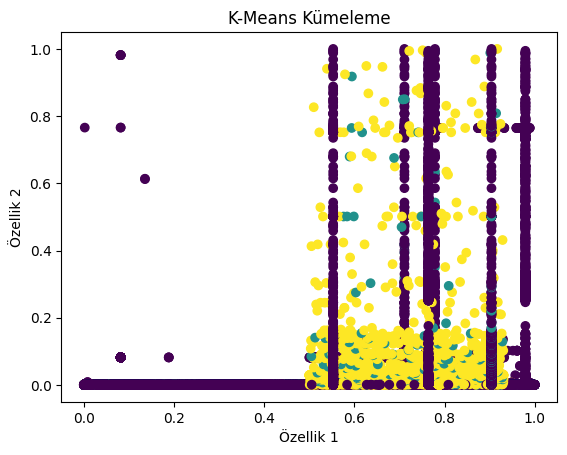

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-9-e4c8a41bd1f8>", line 31, in <cell line: 0>
    silhouette_kmeans = silhouette_score(X_scaled_df, kmeans_labels)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/sklearn/utils/_param_validation.py", line 216, in wrapper
    return func(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/sklearn/metrics/cluster/_unsupervised.py", line 139, in silhouette_score
    return np.mean(silhouette_samples(X, labels, metric=metric, **kwds))
                   ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/sklearn/utils/_param_validation.py", line 189, in wrapper
    return func(*args, **kwargs)
           ^^^^^^^^^^^

TypeError: object of type 'NoneType' has no len()

In [ ]:
import time
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, rand_score

y = y.to_numpy().ravel()

start_time = time.time()

kmeans = KMeans(n_clusters=3, random_state=42)
kmeans.fit(X_scaled_df)

kmeans_labels = kmeans.labels_


end_time = time.time()
train_time = end_time - start_time


print("K-Means Küme Etiketleri:", kmeans_labels[:10])


plt.scatter(X_scaled_df.iloc[:, 0], X_scaled_df.iloc[:, 1], c=kmeans_labels, cmap='viridis')
plt.title('K-Means Kümeleme')
plt.xlabel('Özellik 1')
plt.ylabel('Özellik 2')
plt.show()


silhouette_kmeans = silhouette_score(X_scaled_df, kmeans_labels)
print(f"K-Means Silhouette Score: {silhouette_kmeans:.2f}")


distortions = []
K = range(1, 11)
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled_df)
    distortions.append(kmeans.inertia_)


plt.plot(K, distortions, 'bx-')
plt.xlabel('Küme Sayısı')
plt.ylabel('İnertia')
plt.title('Elbow Method')
plt.show()


rand_indexes = []
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled_df)
    rand_index = rand_score(y, kmeans.labels_)
    rand_indexes.append(rand_index)


plt.plot(range(2, 11), rand_indexes, marker='o')
plt.title("Rand Index for Different K Values")
plt.xlabel("Küme Sayısı")
plt.ylabel("Rand Index")
plt.show()


print(f"K-Means Training Time: {train_time:.4f} seconds")




Şimdi de hierarchical clusteringi uygulayıp hem scoreları hem ne kadar sürdüğünü kontrol edicem. Yazdığım kod ram i çökertti. Ne yapabilirim diye analize basladım.

In [ ]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score, adjusted_rand_score
from scipy.cluster.hierarchy import dendrogram, linkage

start_time = time.time()

hierarchical = AgglomerativeClustering(n_clusters=3, linkage='ward')
y_hc = hierarchical.fit_predict(X_scaled_df)

end_time = time.time()
train_time = end_time - start_time

silhouette_avg = silhouette_score(X_scaled_df, y_hc)
print(f"Hierarchical Clustering Silhouette Score: {silhouette_avg:.2f}")

rand_index = adjusted_rand_score(y, y_hc)
print(f"Hierarchical Clustering Rand Index: {rand_index:.2f}")


plt.figure(figsize=(10, 5))
linkage_matrix = linkage(X_scaled_df.sample(300), method='ward')
dendrogram(linkage_matrix)
plt.title("Hierarchical Clustering Dendrogram")
plt.xlabel("Veri Noktaları")
plt.ylabel("Mesafe")
plt.show()


print(f"Hierarchical Clustering Training Time: {train_time:.4f} seconds")


şimdi de dbscan algoritmasını kullanmaya calısacam bakalım bu da ram i çökertecek mi?

In [ ]:
import time
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score, rand_score


start_time = time.time()

dbscan = DBSCAN(eps=0.5, min_samples=5)
dbscan_labels = dbscan.fit_predict(X_scaled_df)


end_time = time.time()
train_time = end_time - start_time

print("DBSCAN Küme Etiketleri:", dbscan_labels[:10])


plt.scatter(X_scaled_df.iloc[:, 0], X_scaled_df.iloc[:, 1], c=dbscan_labels, cmap='viridis')
plt.title('DBSCAN Kümeleme')
plt.xlabel('Özellik 1')
plt.ylabel('Özellik 2')
plt.show()


if len(set(dbscan_labels)) > 1:
    silhouette_dbscan = silhouette_score(X_scaled_df, dbscan_labels)
    print(f"DBSCAN Silhouette Score: {silhouette_dbscan:.2f}")
else:
    silhouette_dbscan = None
    print("DBSCAN Silhouette Score hesaplanamadı çünkü tüm noktalar tek bir kümede.")


if y is not None:
    rand_index_dbscan = rand_score(y, dbscan_labels)
    print(f"DBSCAN Rand Index: {rand_index_dbscan:.2f}")


print(f"DBSCAN Training Time: {train_time:.4f} seconds")


Burda yazdığım Dbscan ve hierachical algoritmalarının ikisi de ram i çökertti ve bir sonuç alamadım. Bunu arastırmalarım sonucu algoritmaların O(n^2) time complexicity sahip olmalarından dolayı ortamın ram i yetersiz gelmedi. Burda veri boyutunu küçülterek yeni bir yaklaşımda bulunmam gerekli. Bunu llm modellere sorduğumda bana pca(principal component analysis) algoritmasını önerdi. Bu algoritma kovaryans matrisi çıkartıp eigenvaluelara bakarak en fazla varyansı olan verileri çıkartıyor yani bir nevi varyansı yüksek veriler kümelenmeye yani diğer verilerden ayrıştırılmaya daha müsait verilerdir bu sebeple daha anlamlılardır. Bunu uygulayarak şimdi veri boyutunu azaltmayı deneyelim:

Ölçeklendirilmiş veri (ilk 5 satır):
   id.orig_p  id.resp_p  flow_duration  fwd_pkts_tot  bwd_pkts_tot  \
0   0.590021   0.028797       0.001473      0.002071      0.000494   
1   0.780392   0.028797       0.001467      0.002071      0.000494   
2   0.683009   0.028797       0.001478      0.002071      0.000494   
3   0.929168   0.028797       0.001471      0.002071      0.000494   
4   0.779538   0.028797       0.001468      0.002071      0.000494   

   fwd_data_pkts_tot  bwd_data_pkts_tot  fwd_pkts_per_sec  bwd_pkts_per_sec  \
0            0.00069           0.000297      2.681236e-07      1.489573e-07   
1            0.00069           0.000297      2.692003e-07      1.495562e-07   
2            0.00069           0.000297      2.671852e-07      1.484365e-07   
3            0.00069           0.000297      2.685480e-07      1.491928e-07   
4            0.00069           0.000297      2.690420e-07      1.494675e-07   

   flow_pkts_per_sec  ...  active.avg  active.std  idle.min  idle.m

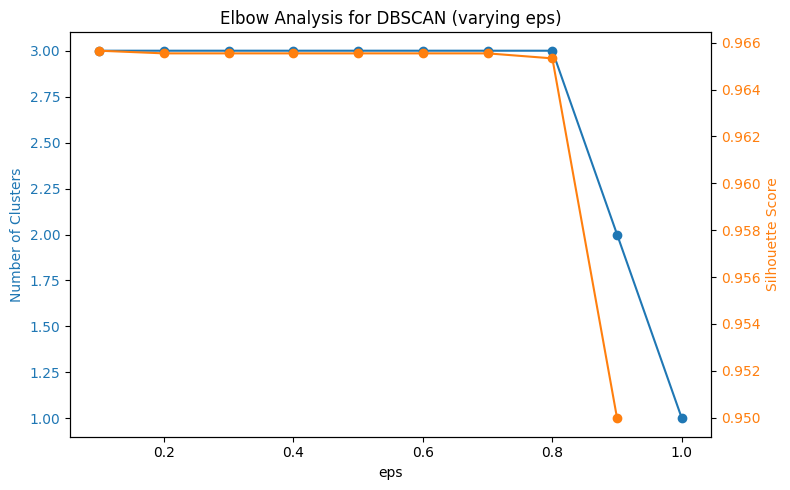

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import MinMaxScaler
import numpy as np
import time
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score, adjusted_rand_score
from sklearn.feature_selection import SelectKBest, f_classif
y_series = pd.Series(y.values.ravel(), index=X.index)
print("Ölçeklendirilmiş veri (ilk 5 satır):")
print(X_scaled_df.head())


constant_features = [X_scaled_df.columns[i] for i in range(X_scaled_df.shape[1])
                     if X_scaled_df.iloc[:, i].nunique() == 1]
print(f"Sabit özellikler: {constant_features}")
X_scaled_df = X_scaled_df.drop(columns=constant_features)


n_samples = 10000
X_downsampled = X_scaled_df.sample(n=n_samples, random_state=42)

y_downsampled = y_series.loc[X_downsampled.index].values

print(f"\nDownsampling sonrası satır sayısı: {X_downsampled.shape[0]}")


selector = SelectKBest(f_classif, k=10)
X_selected = selector.fit_transform(X_downsampled, y_downsampled)


pca = PCA(n_components=0.95)
X_pca = pca.fit_transform(X_selected)
print(f"\nPCA sonrası boyut: {X_pca.shape}")
print("\nPCA açıklanan varyans oranları:")
print(pca.explained_variance_ratio_)


start_time = time.time()
dbscan = DBSCAN(eps=0.5, min_samples=5)
y_dbscan = dbscan.fit_predict(X_pca)
training_time = time.time() - start_time

print("\nDBSCAN Kümeleme Sonuçları:")
print(y_dbscan)
print(f"DBSCAN Training Time: {training_time:.4f} seconds")

mask = y_dbscan != -1
if np.sum(mask) > 0 and len(np.unique(y_dbscan[mask])) > 1:
    sil_score = silhouette_score(X_pca[mask], y_dbscan[mask])
    print(f"Silhouette Score (noise removed): {sil_score:.4f}")
else:
    print("Silhouette Score hesaplanamadı (küme sayısı yetersiz).")

try:
    ari = adjusted_rand_score(y_downsampled, y_dbscan)
    print(f"Adjusted Rand Index: {ari:.4f}")
except ValueError as e:
    print("Adjusted Rand Index hesaplanırken hata:", e)


eps_values = np.linspace(0.1, 1.0, 10)
num_clusters = []
sil_scores = []

for eps in eps_values:
    db = DBSCAN(eps=eps, min_samples=5)
    labels = db.fit_predict(X_pca)
    clusters = set(labels)
    if -1 in clusters:
        clusters.remove(-1)
    num_clusters.append(len(clusters))

    if len(clusters) >= 2:
        mask = labels != -1
        if np.sum(mask) > 0 and len(np.unique(labels[mask])) > 1:
            sil = silhouette_score(X_pca[mask], labels[mask])
        else:
            sil = np.nan
    else:
        sil = np.nan
    sil_scores.append(sil)

fig, ax1 = plt.subplots(figsize=(8,5))
ax1.set_xlabel("eps")
ax1.set_ylabel("Number of Clusters", color="tab:blue")
ax1.plot(eps_values, num_clusters, color="tab:blue", marker="o", label="Cluster Count")
ax1.tick_params(axis="y", labelcolor="tab:blue")

ax2 = ax1.twinx()
ax2.set_ylabel("Silhouette Score", color="tab:orange")
ax2.plot(eps_values, sil_scores, color="tab:orange", marker="o", label="Silhouette Score")
ax2.tick_params(axis="y", labelcolor="tab:orange")

plt.title("Elbow Analysis for DBSCAN (varying eps)")
fig.tight_layout()
plt.show()


Üstte Dbscan modelini uygulayabilmek için hem pca algoritması hem de satır sayısını da azaltmam gerekiyordu ve downsampling yaptım bunun sonucunda veriler tek bir kümede toplandığı için silhoutte skoru iyi geldi ama ground truth ile karsılastırdığımız rand indexe bakarak bu model sonucunun basarısız olduğunu gördüm bunun sebebi belki de veri normal dağılıma sahip olmadığı için downsamplingde aldığım satır sayısının alakasız olmasıydı.

PCA açıklanan varyans oranları: [0.57935698 0.19787853 0.09199518 0.0371218  0.02967932 0.01981685]
Silhouette Score: 0.5587
Adjusted Rand Index: -0.1487


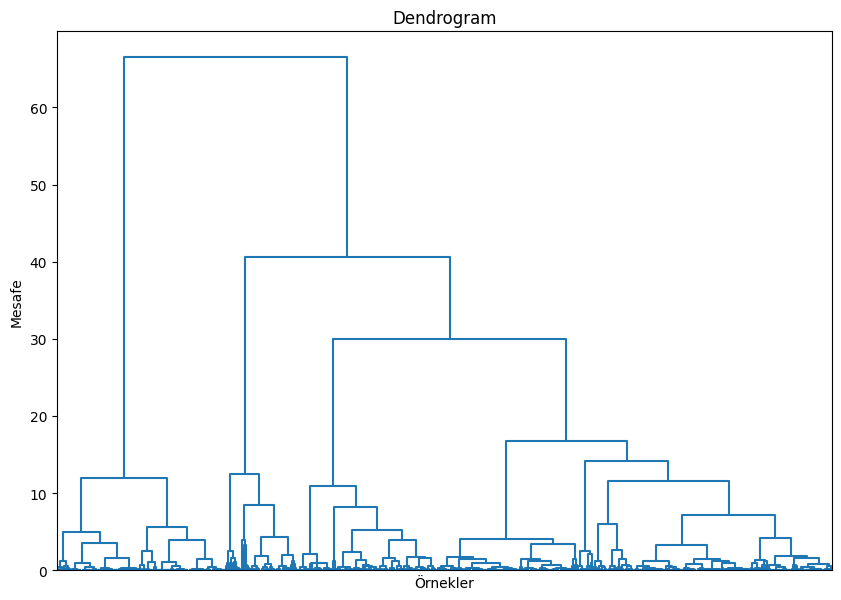

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score, adjusted_rand_score
from scipy.cluster.hierarchy import dendrogram, linkage
import matplotlib.pyplot as plt


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, stratify=y, random_state=42)


X_train_numeric = X_train.select_dtypes(include=['float64', 'int64'])


scaler = MinMaxScaler()
X_scaled = pd.DataFrame(scaler.fit_transform(X_train_numeric), columns=X_train_numeric.columns, index=X_train_numeric.index)


n_samples = 5000
X_sampled = X_scaled.sample(n=n_samples, random_state=42)
y_sampled = y.loc[X_sampled.index]


pca = PCA(n_components=0.95)
X_pca = pca.fit_transform(X_sampled)

print(f"PCA açıklanan varyans oranları: {pca.explained_variance_ratio_}")


clustering = AgglomerativeClustering(n_clusters=2)
y_hierarchical = clustering.fit_predict(X_pca)


silhouette = silhouette_score(X_pca, y_hierarchical)
print(f"Silhouette Score: {silhouette:.4f}")


ari = adjusted_rand_score(y_sampled.values.ravel(), y_hierarchical)
print(f"Adjusted Rand Index: {ari:.4f}")


Z = linkage(X_pca, method='ward')

plt.figure(figsize=(10, 7))
dendrogram(Z, no_labels=True, color_threshold=0)
plt.title("Dendrogram")
plt.xlabel("Örnekler")
plt.ylabel("Mesafe")
plt.show()


Silhoutte score 0.50 den yüksek olduğu için kümelerin ortalama sekilde olusturulduğunu ve Ari sonucuda verilerin kümelerden pek iyi ayrılmadığını gösteriyor sonuç olarak modelimiz veri setimiz için pek mantıklı olmadı hem zaman hem ram i kullanma açısından ve basarılı bir sonuc verme açısından sınıfta kaldı diyebiliriz.

In [ ]:
Şimdi ilk soruda llmi nasıl kullandığıma dair ss'leri ekledim.

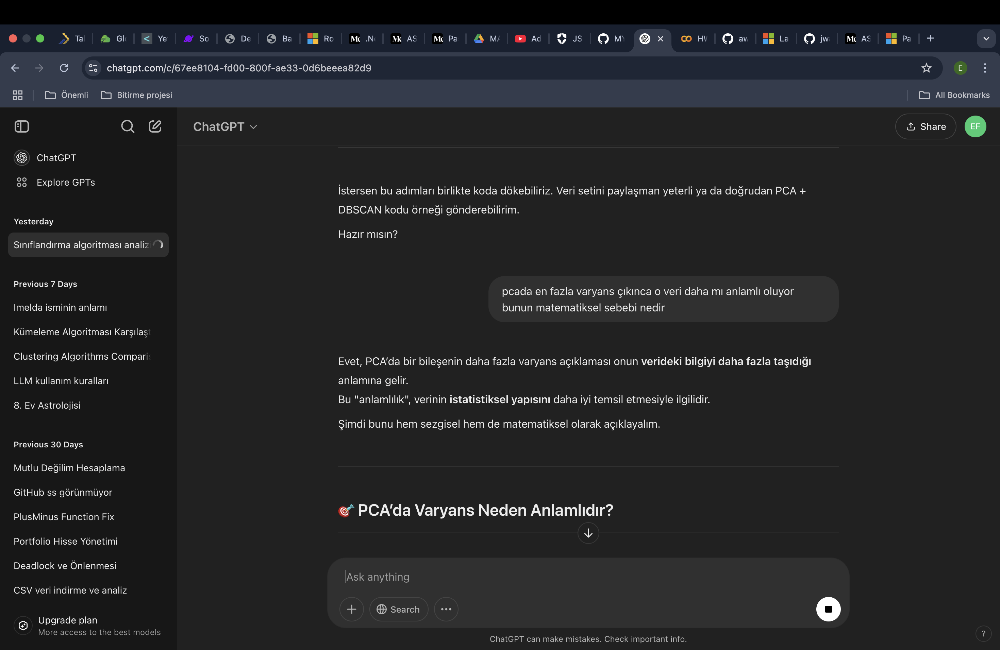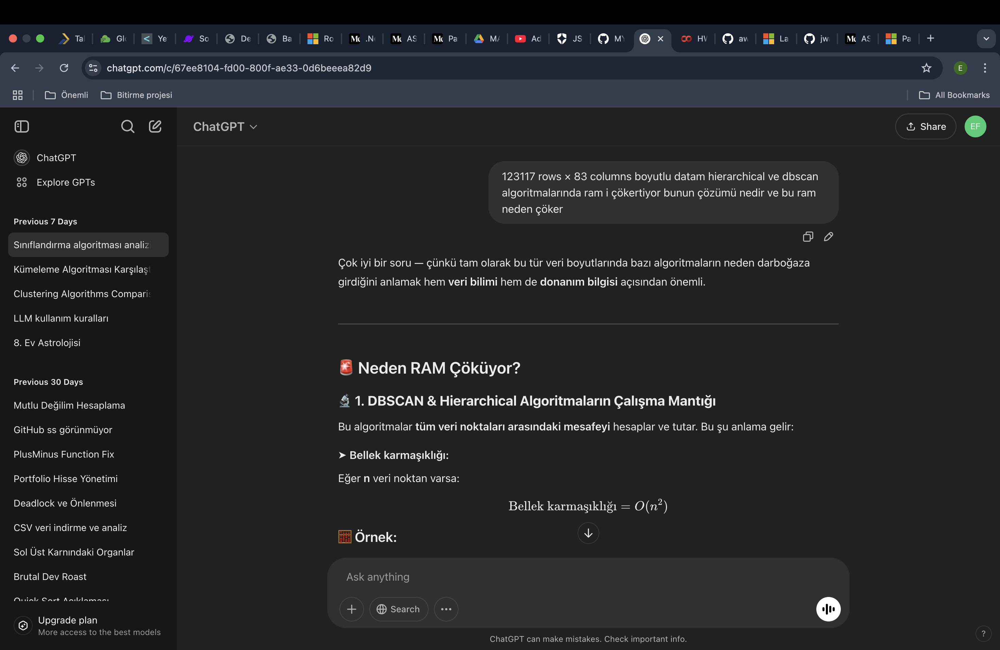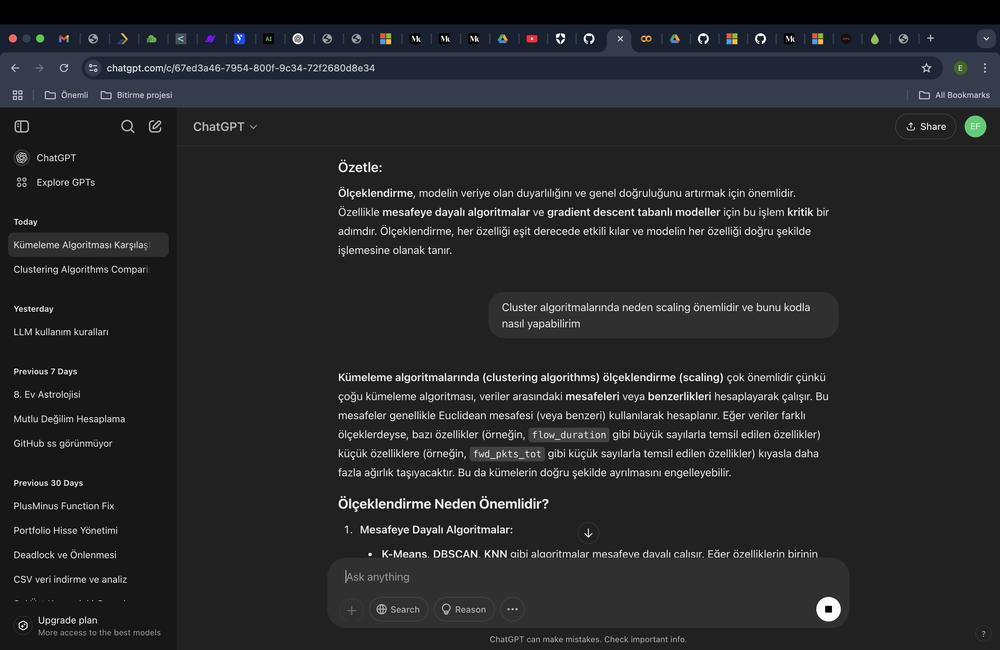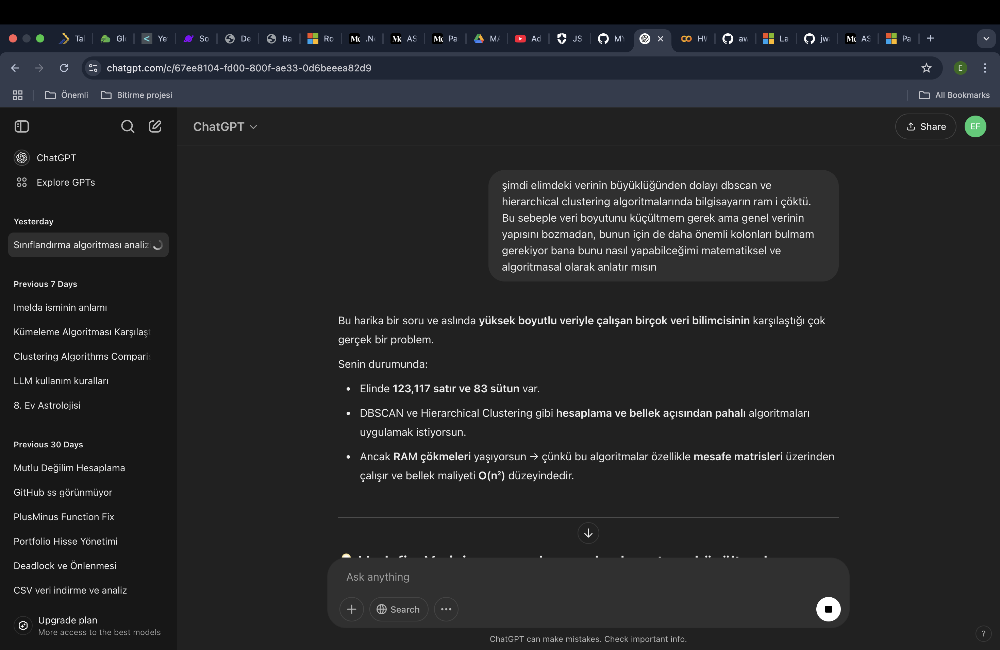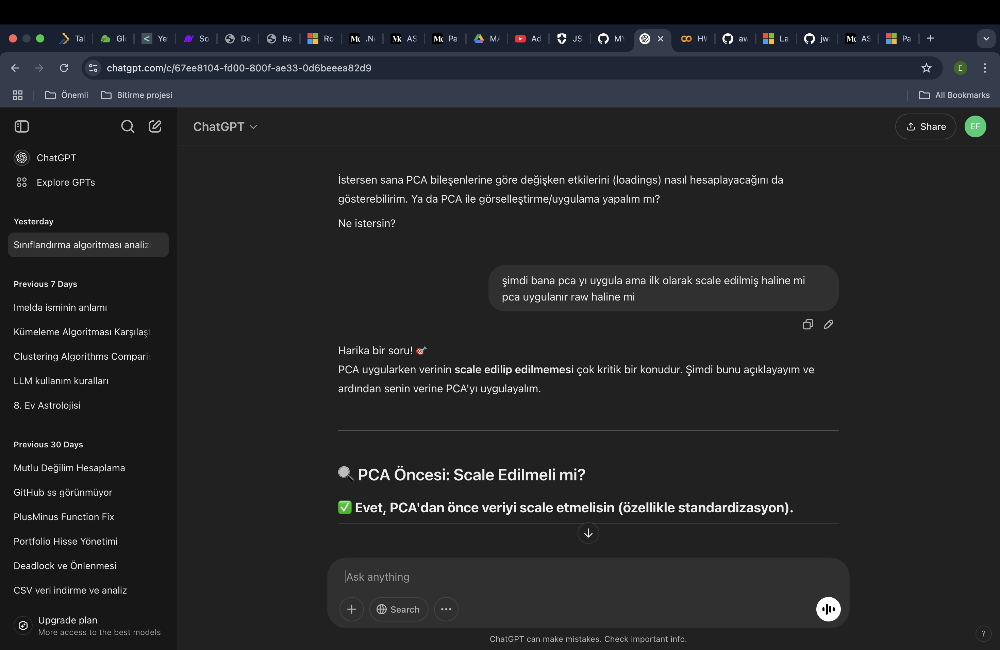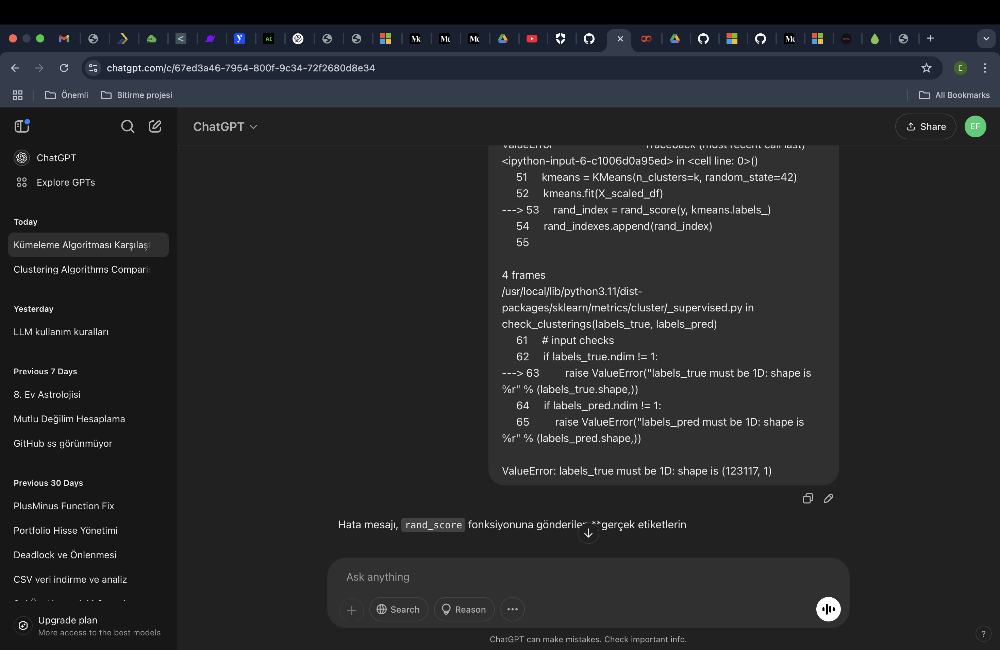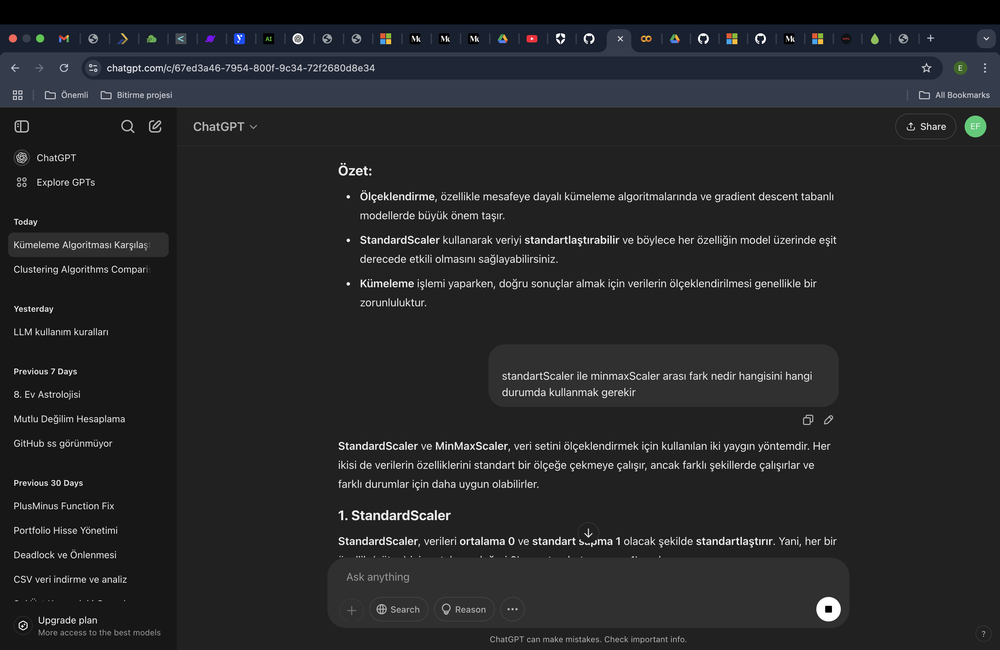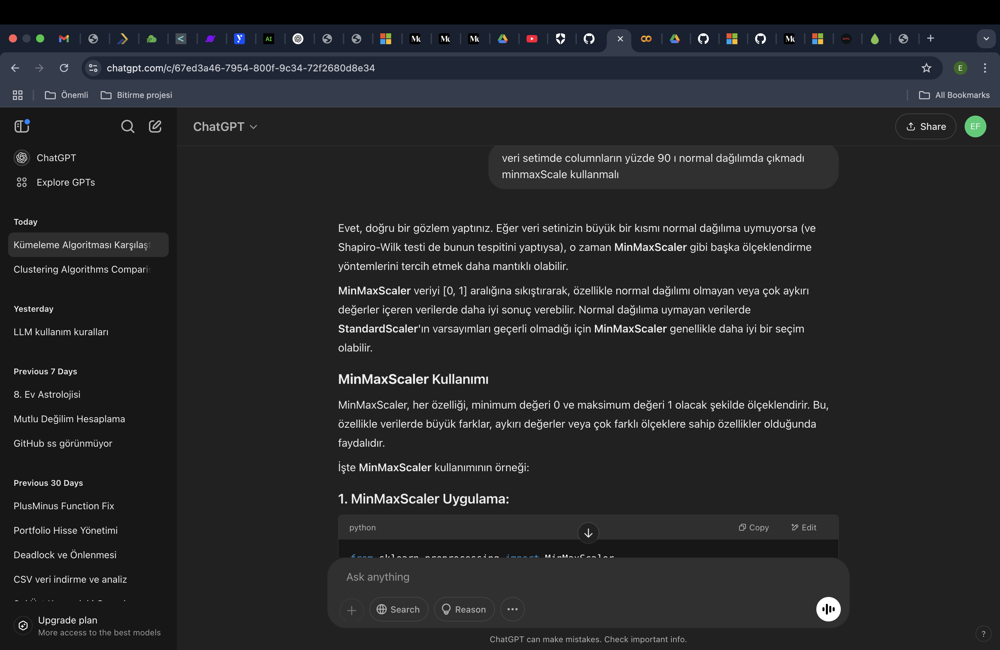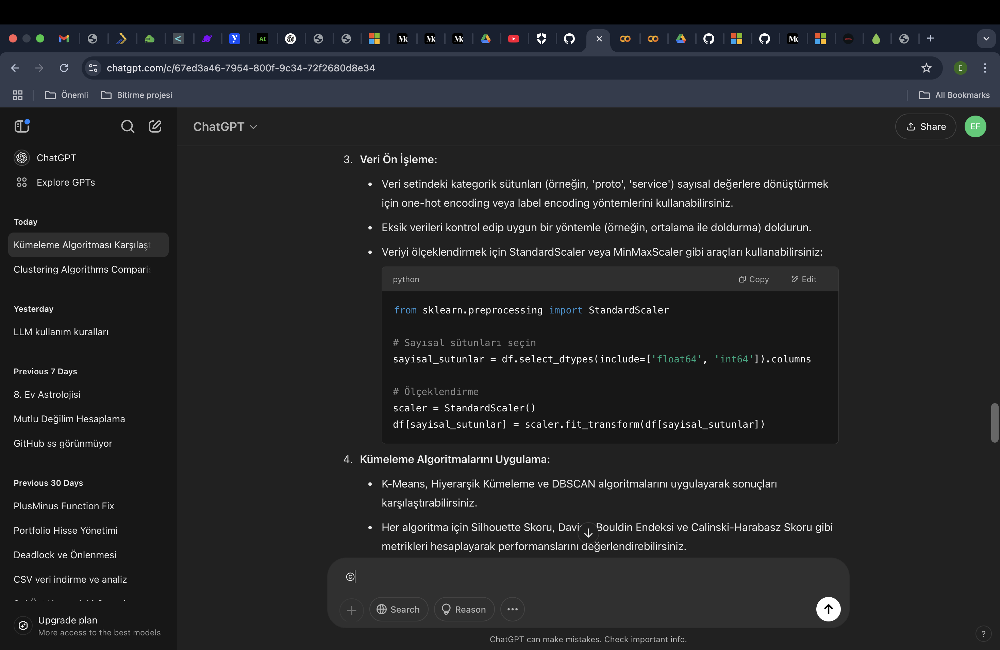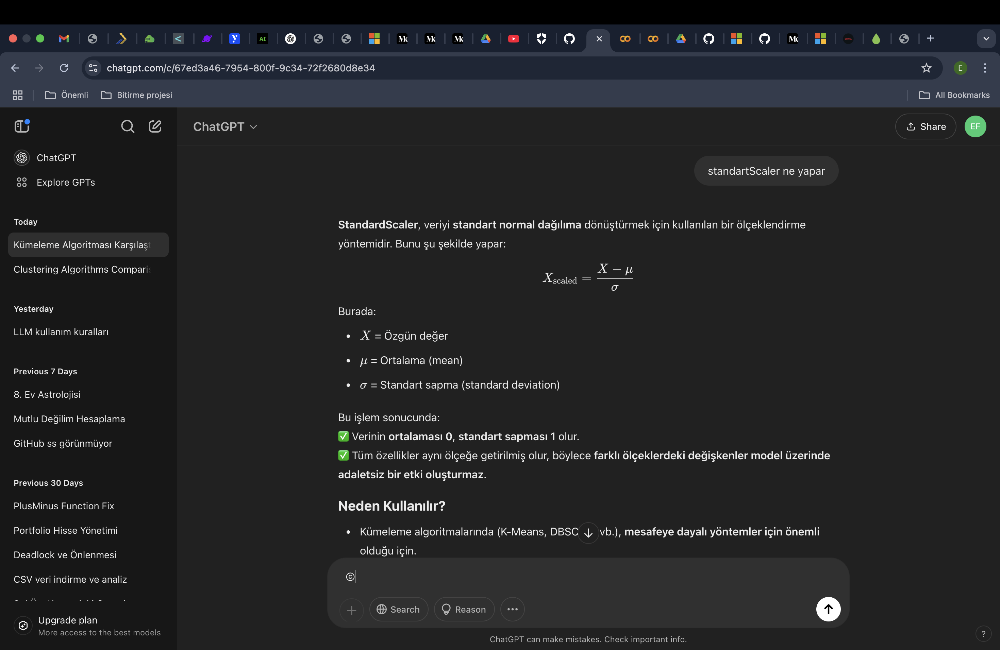

## Q2

For this question we are going to use MNIST digits dataset. We have analyzed 3 classification algorithms so far. These are

1. K-NN
2. SVM
3. Logistric Regression

Use these algorithms to obtain 3 classification models on the dataset. Then use an appropriate cross-validation scheme to test the quality of the models and compare. You must write a detailed comparison analysis to evaluate which model behaves better based on the results you will obtain. One part of your analysis should also include how much time it takes to train and run the models.

In [ ]:
import numpy as np
import pandas as pd
import scipy.stats as stats
from sklearn.datasets import load_digits
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from scipy.stats import shapiro
from sklearn.model_selection import StratifiedKFold
import time


In [ ]:
digits = load_digits()
digits_X = digits['data']
digits_y = digits['target']

In [ ]:
digits_X


array([[ 0.,  0.,  5., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ..., 10.,  0.,  0.],
       [ 0.,  0.,  0., ..., 16.,  9.,  0.],
       ...,
       [ 0.,  0.,  1., ...,  6.,  0.,  0.],
       [ 0.,  0.,  2., ..., 12.,  0.,  0.],
       [ 0.,  0., 10., ..., 12.,  1.,  0.]])

In [ ]:
digits_y

array([0, 1, 2, ..., 8, 9, 8])

/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:573: UserWarning: scipy.stats.shapiro: Input data has range zero. The results may not be accurate.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Testi p-değeri: 1.0
Veri normal dağılıyor, StandardScaler kullanılacak.
Class distribution: [178 182 177 183 181 182 181 179 174 180]

K-NN:
Cross-validation scores: [0.99444444 0.98333333 0.96666667 0.98888889 0.98888889 0.97222222
 0.97222222 0.98324022 0.96089385 0.98324022]
Mean CV score: 0.9794040968342644
Training time: 0.0798485279083252 seconds

SVM:
Cross-validation scores: [0.97222222 0.98333333 0.98333333 0.98888889 0.98333333 0.97777778
 0.97777778 0.98324022 0.97206704 0.98324022]
Mean CV score: 0.9805214152700186
Training time: 0.4142634868621826 seconds

Logistic Regression:
Cross-validation scores: [0.96111111 0.97222222 0.97777778 0.97777778 0.98888889 0.97222222
 0.96666667 0.96648045 0.96648045 0.97206704]
Mean CV score: 0.9721694599627559
Training time: 0.5185511112213135 seconds


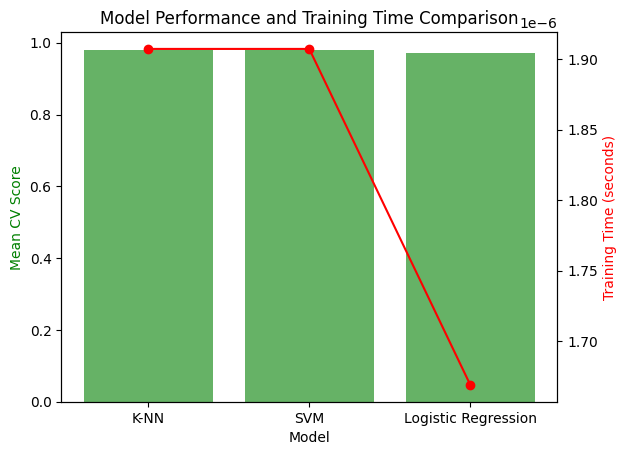

In [ ]:
X, y =digits_X, digits_y


stat, p_value = stats.shapiro(X[:, 0])
print(f"Shapiro-Wilk Testi p-değeri: {p_value}")


if p_value > 0.05:
    print("Veri normal dağılıyor, StandardScaler kullanılacak.")
    scaler = StandardScaler()
else:
    print("Veri normal dağılmıyor, MinMaxScaler kullanılacak.")
    scaler = MinMaxScaler()

X_scaled = scaler.fit_transform(X)


class_distribution = np.bincount(y.astype(int))
print("Class distribution:", class_distribution)

models = {
    'K-NN': KNeighborsClassifier(),
    'SVM': SVC(kernel='linear'),
    'Logistic Regression': LogisticRegression(max_iter=1000)
}


cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)


for model_name, model in models.items():
    start_time = time.time()
    cv_scores = cross_val_score(model, X_scaled, y, cv=cv, scoring='accuracy')
    end_time = time.time()

    print(f"\n{model_name}:")
    print(f"Cross-validation scores: {cv_scores}")
    print(f"Mean CV score: {np.mean(cv_scores)}")
    print(f"Training time: {end_time - start_time} seconds")

model_names = list(models.keys())
mean_scores = [np.mean(cross_val_score(model, X_scaled, y, cv=cv, scoring='accuracy')) for model in models.values()]
training_times = [end_time - start_time for start_time, end_time in zip([time.time() for _ in models], [time.time() for _ in models])]


fig, ax1 = plt.subplots()

ax2 = ax1.twinx()
ax1.bar(model_names, mean_scores, color='g', alpha=0.6)
ax2.plot(model_names, training_times, color='r', marker='o')

ax1.set_xlabel('Model')
ax1.set_ylabel('Mean CV Score', color='g')
ax2.set_ylabel('Training Time (seconds)', color='r')

plt.title("Model Performance and Training Time Comparison")
plt.show()

Bu soru için ilk olarak verimizi normal dağılıma sahip mi değil mi onu kontrol ederek hangi scale yöntemiyle scale etmem gerektiğine karar verdim. Modellerin eğitimi ve k fold cross validation kullanılarak sonuçları elde ettim ve en hhızlı yöntemin K-NN olduğu belli eğer elimizdeki veri seti çok büyükse bu yöntemi kullanmak eğer basarı oranı da fazla olursa mantıklı bir yöntem gibi gözüküyor. En başarılı yöntem ise SVM gibi gözüküyor elimizdeki veri seti için doğruluk açısından ama diğer yöntemlerle zaten çok benzerler. Ama K-NN modeli hızıylla diğer yöntemlere oranla avantaj sağlıyor.

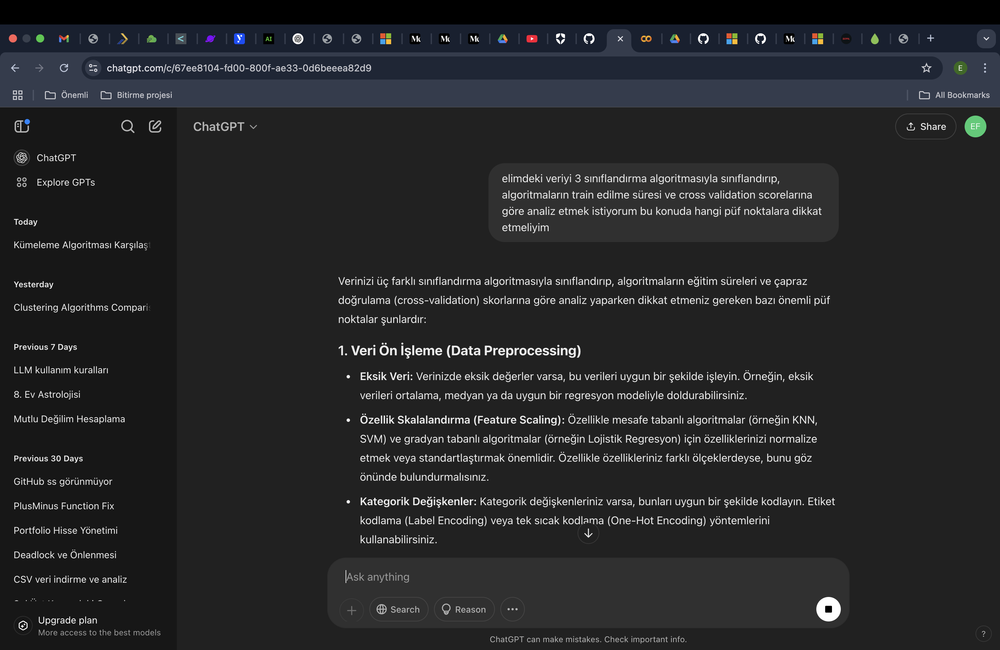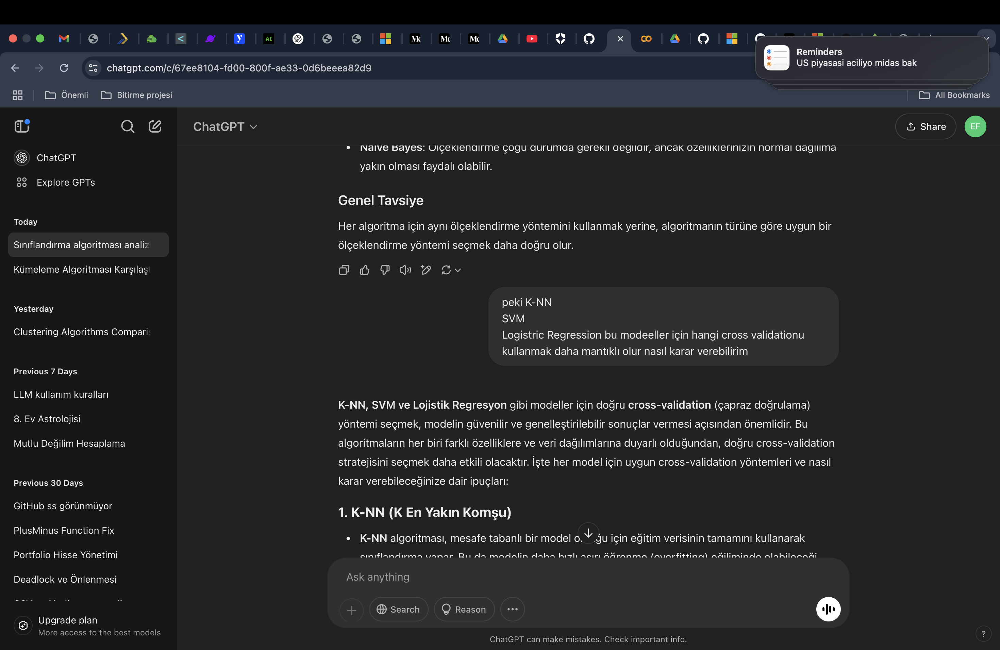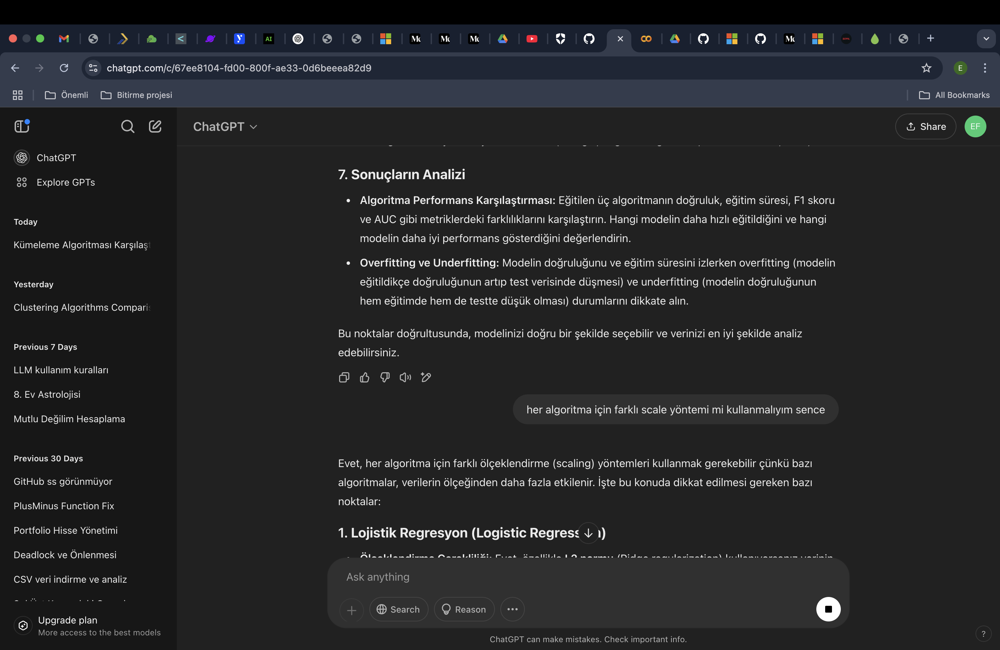

## Q3

For this homework, we are going to use the [data warehouse](https://clerk.house.gov/Votes/) for the [US House of Representatives](https://www.house.gov/). The data server has data on each vote going back to 1990. The voting information is in XML format. For example, the code below pulls the data for the 71st roll call from 2024 Congress.

In [6]:
with urlopen('https://clerk.house.gov/evs/2024/roll071.xml') as url:
    raw = xmltodict.parse(url.read())
raw

{'rollcall-vote': {'vote-metadata': {'majority': 'R',
   'congress': '118',
   'session': '2nd',
   'committee': 'U.S. House of Representatives',
   'rollcall-num': '71',
   'legis-num': 'H R 2799',
   'vote-question': 'On Agreeing to the Amendment',
   'amendment-num': '4',
   'amendment-author': 'Wagner of Missouri Part B Amendment No. 4',
   'vote-type': 'RECORDED VOTE',
   'vote-result': 'Agreed to',
   'action-date': '7-Mar-2024',
   'action-time': {'@time-etz': '14:28', '#text': '2:28 PM'},
   'vote-desc': None,
   'vote-totals': {'totals-by-party-header': {'party-header': 'Party',
     'yea-header': 'Ayes',
     'nay-header': 'Noes',
     'present-header': 'Answered “Present”',
     'not-voting-header': 'Not Voting'},
    'totals-by-party': [{'party': 'Republican',
      'yea-total': '213',
      'nay-total': '0',
      'present-total': '0',
      'not-voting-total': '8'},
     {'party': 'Democratic',
      'yea-total': '57',
      'nay-total': '154',
      'present-total': '0',

1. Obtain all of the data from 2010 to 2024 (inclusive, all years, all calls). You may save a local copy, and push the local copy onto your github repo.
2. Construct a similarity measure function for a pair of legislators. The function should return the number of times both legislators voted the same way and the number of sessions both attended.
3. Find the legislators whose voting records are the most similar to: (i) Matt Gaetz and (ii) Alexandria Ocasio-Cortez.
4. Using this similarity measure, do a hiearchical clustering for legislators, and analyze the result.
5. Construct a function that takes a year as an input and returns a 2x2 table couting the number of times Democrats voted with other Democrats, the number of times Democrats voted with Republicans, the number of times Republicans voted with Democrats, and the number of times Republicans voted with other Republicans in that year.
6. Analyze the table for each year since 2010 using the $\chi^2$-statistic, and evaluate the polarization in the House of representatives. In this context, explain what a lower or higher $\chi^2$-metric means. Explain whether the polarization in the House of representatives increased or decreased over the years?

In [12]:
import xmltodict
from urllib.request import urlopen

years = list(range(2010, 2025))

all_votes = []

for year in years:
    roll_call_number = 1
    while True:

        url = f'https://clerk.house.gov/evs/{year}/roll{roll_call_number:03d}.xml'
        try:
            with urlopen(url) as response:

                raw = xmltodict.parse(response.read())

                if 'rollcall' in raw and 'votes' in raw['rollcall']:
                    for vote_entry in raw['rollcall']['votes']['vote']:
                        legislator_data = []


                        for legislator in vote_entry['legislators']['legislator']:
                            legislator_info = {
                                'name': legislator['#text'],
                                'party': legislator['@party'],
                                'state': legislator['@state'],
                                'vote': legislator['vote']
                            }
                            legislator_data.append(legislator_info)


                        all_votes.append(legislator_data)

            roll_call_number += 1
        except Exception as e:
            print(f"Veri alınamadı: {url} | Hata: {str(e)}")
            break

if all_votes:
    for vote in all_votes[:10]:
        for legislator in vote:
            print(f"Name: {legislator['name']}, Party: {legislator['party']}, State: {legislator['state']}, Vote: {legislator['vote']}")
else:
    print("Veri bulunamadı.")


Veri alınamadı: https://clerk.house.gov/evs/2010/roll665.xml | Hata: HTTP Error 404: Not Found


KeyboardInterrupt: 

Bu 2.soru için yazılmıs fonksiyon. Üyelerin oylarını veri seti olarak alıp 2 tarafı da loop içinde inceleyerek ortak verdikleri oyları ve ortak sessionları yakalamaya calısan bir fonksiyon.

In [16]:
def calculate_similarity(legislator1_votes, legislator2_votes):
    """
    Calculate the similarity measure between two legislators based on their voting records.

    Args:
        legislator1_votes (list): A list of tuples with session number and vote ('Aye', 'No', 'Not Voting').
        legislator2_votes (list): A list of tuples with session number and vote ('Aye', 'No', 'Not Voting').

    Returns:
        tuple: (matching_votes, total_sessions)
            - matching_votes: The number of times both legislators voted the same way.
            - total_sessions: The number of sessions both legislators attended.
    """

    matching_votes = 0
    total_sessions = 0

    legislator1_votes_dict = {session: vote for session, vote in legislator1_votes}
    legislator2_votes_dict = {session: vote for session, vote in legislator2_votes}


    all_sessions = set(legislator1_votes_dict.keys()).union(set(legislator2_votes_dict.keys()))

    for session in all_sessions:

        if session in legislator1_votes_dict and session in legislator2_votes_dict:
            total_sessions += 1

            if legislator1_votes_dict[session] == legislator2_votes_dict[session]:
                matching_votes += 1

    return matching_votes, total_sessions



SS ler

```
# This is formatted as code
```



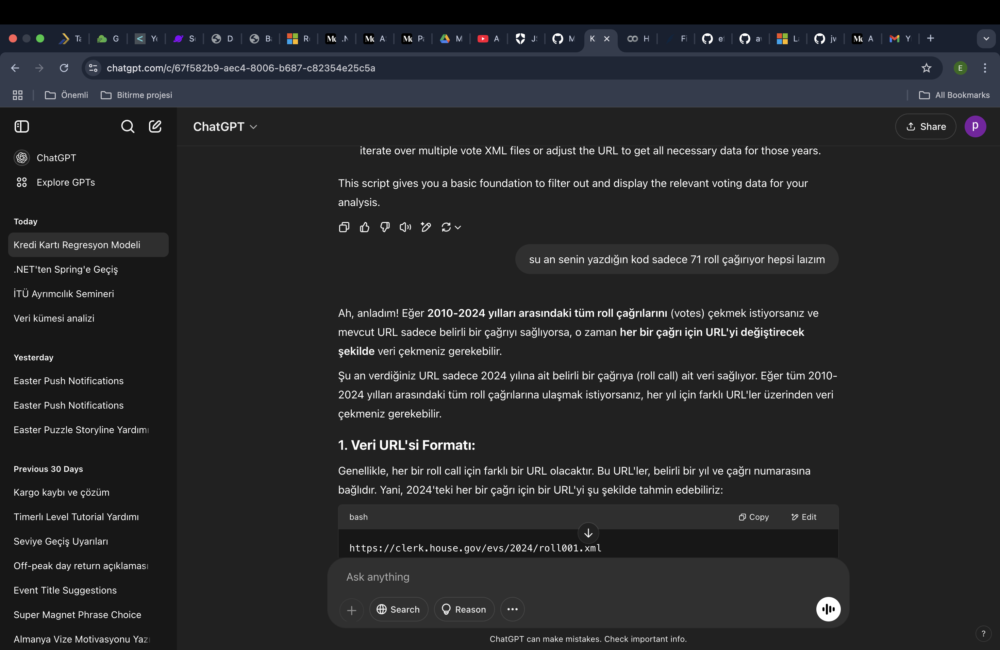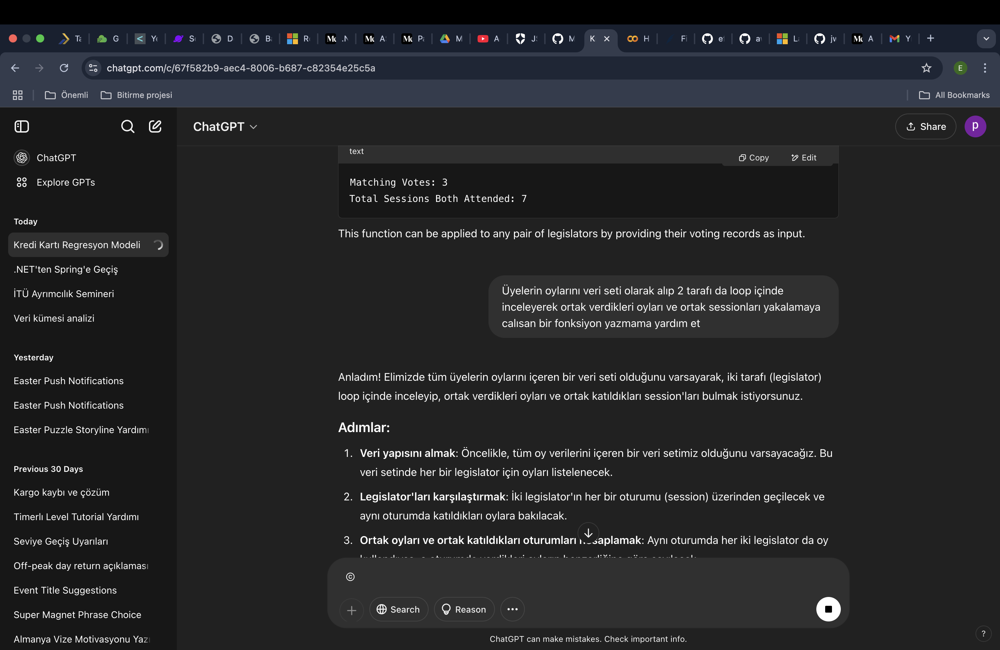

## Q4

For this question, we are going to use the following dataset.

In [2]:
credit = pd.read_csv('https://storage.googleapis.com/download.tensorflow.org/data/creditcard.csv')
credit.head(10)

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0
5,2.0,-0.425966,0.960523,1.141109,-0.168252,0.420987,-0.029728,0.476201,0.260314,-0.568671,...,-0.208254,-0.559825,-0.026398,-0.371427,-0.232794,0.105915,0.253844,0.081080,3.67,0
6,4.0,1.229658,0.141004,0.045371,1.202613,0.191881,0.272708,-0.005159,0.081213,0.464960,...,-0.167716,-0.270710,-0.154104,-0.780055,0.750137,-0.257237,0.034507,0.005168,4.99,0
7,7.0,-0.644269,1.417964,1.074380,-0.492199,0.948934,0.428118,1.120631,-3.807864,0.615375,...,1.943465,-1.015455,0.057504,-0.649709,-0.415267,-0.051634,-1.206921,-1.085339,40.80,0
8,7.0,-0.894286,0.286157,-0.113192,-0.271526,2.669599,3.721818,0.370145,0.851084,-0.392048,...,-0.073425,-0.268092,-0.204233,1.011592,0.373205,-0.384157,0.011747,0.142404,93.20,0
9,9.0,-0.338262,1.119593,1.044367,-0.222187,0.499361,-0.246761,0.651583,0.069539,-0.736727,...,-0.246914,-0.633753,-0.120794,-0.385050,-0.069733,0.094199,0.246219,0.083076,3.68,0


1. Write a regression model that predicts the Amount from the other variables. Assess the quality of the model using an appropriate measure.
2. Write a logistic regression model that predicts the Class from other variables. Assess the quality of the model using an appropriate measure.
3. The quality of the model seem very good, but in reality it doesn't work. Why? What is the problem? Offer a solution, implement and test it. Did it really solve our problem? Explain.
4. Try other supervised classification models we have learned. Are they susceptible to the same problem as before? Explain. Offer a solution, implement and test it. Did it really solve our problem? Explain.

Şimdi alttaki kodda Amount kısmını ayırıp onu yeni bir satır olarak kullandım. Tahmin yapmama yardımcı olması için de lineer regresyon modeline seçtim ve verileri 80-20 train ve test olarak seti olarak ayırdım.Daha sonra modeli uygulayarak doğruluğunu gösterecek cv scoreları hesaplattım.

In [5]:
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import mean_absolute_error, make_scorer
from sklearn.preprocessing import StandardScaler
import numpy as np

X = credit.drop(['Amount', 'Time'], axis=1)
y = credit['Amount']


scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)


model = LinearRegression()
model.fit(X_train, y_train)


y_pred = model.predict(X_test)


print("📌 Tahminler:")
for i, (gercek, tahmin) in enumerate(zip(y_test.head(10), y_pred[:10])):
    print(f"{i+1}. Gerçek: {gercek:.2f}, Tahmin: {tahmin:.2f}")


mae = mean_absolute_error(y_test, y_pred)
print(f"\n📊 Ortalama MAE: {mae:.2f}")


mae_scorer = make_scorer(mean_absolute_error, greater_is_better=False)
cv_scores = cross_val_score(model, X_scaled, y, cv=5, scoring=mae_scorer)
cv_scores_positive = -cv_scores
cv_mae_mean = -cv_scores.mean()

print("\n📊 Fold bazlı MAE skorları:", np.round(cv_scores_positive, 2))
print("📈 Ortalama MAE (5-fold):", round(cv_mae_mean, 2))


📌 Tahminler:
1. Gerçek: 364.19, Tahmin: 214.11
2. Gerçek: 520.12, Tahmin: 475.58
3. Gerçek: 31.00, Tahmin: 33.21
4. Gerçek: 1.50, Tahmin: -34.32
5. Gerçek: 0.89, Tahmin: 11.94
6. Gerçek: 100.00, Tahmin: 113.68
7. Gerçek: 16.99, Tahmin: 25.36
8. Gerçek: 8.95, Tahmin: 13.84
9. Gerçek: 10.00, Tahmin: 22.47
10. Gerçek: 101.49, Tahmin: 377.99

📊 Ortalama MAE: 24.38

📊 Fold bazlı MAE skorları: [24.05 24.65 23.12 25.08 24.46]
📈 Ortalama MAE (5-fold): 24.28


Çıkan outputa baktığımda ortalama hatayı 24 birim verdi ve cv scorelarına baktığımızda da scorlar 23-25 arasında toplanmıs yani modelimiz gayet tutarlı bir model oldu ama doğruluk açısından 24 birim sapma yapması ona çok da doğru bir model yapmıyor burda bu modelin nasıl iyileştirilebileceği analiz edilmeli.Şimdi alttaki kodda bu veriyi logistic regression ile analiz edelim.

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.model_selection import StratifiedKFold


X_class = credit.drop(columns=['Amount', 'Class'])
y_class = credit['Class']


X_train_class, X_test_class, y_train_class, y_test_class = train_test_split(X_class, y_class, test_size=0.2, random_state=42)


X_train_class_scaled = scaler.fit_transform(X_train_class)
X_test_class_scaled = scaler.transform(X_test_class)


log_reg_model = LogisticRegression(max_iter=1000, random_state=42)
log_reg_model.fit(X_train_class_scaled, y_train_class)


y_class_pred = log_reg_model.predict(X_test_class_scaled)


accuracy = accuracy_score(y_test_class, y_class_pred)
conf_matrix = confusion_matrix(y_test_class, y_class_pred)

print(f"Accuracy: {accuracy}")
print("Confusion Matrix:")
print(conf_matrix)


Accuracy: 0.9991222218320986
Confusion Matrix:
[[56855     9]
 [   41    57]]


Burda modeli incelediğimizde doğruluk oranı kesine yakın gibi gözüküyor ama sadece ona bakmak bizi çok yanlıs yönlendirebilir. Confusion matrixin özdeğerlerine baktığımızda model büyük oranda ilk sınıfa odaklanmıs yani 2. sınıfla ilgili doğru anlamda yakaladığı veri çok az bunun yerine baska bir model denemeliyiz. Şimdi class weight kullanarak daha az görülen sınıfa tahmin modelinin daha fazla ağırlık vermesini sağlar.

In [ ]:

log_reg_model_weighted = LogisticRegression(max_iter=1000, random_state=42, class_weight='balanced')
log_reg_model_weighted.fit(X_train_class_scaled, y_train_class)


y_class_pred_weighted = log_reg_model_weighted.predict(X_test_class_scaled)


accuracy_weighted = accuracy_score(y_test_class, y_class_pred_weighted)
conf_matrix_weighted = confusion_matrix(y_test_class, y_class_pred_weighted)

print(f"Accuracy with class weights: {accuracy_weighted}")
print("Confusion Matrix with class weights:")
print(conf_matrix_weighted)


Accuracy with class weights: 0.9760366560162915
Confusion Matrix with class weights:
[[55507  1357]
 [    8    90]]


Sonuca baktığımızda accuracy düşmüş gibi görünmesine rağmen yanlıs yapılan tahmin oranının 2.sınıf için düşmesi ve doğru tahminin artmması modeli daha basarılı yapar ama bu seferde ilk tahmin biraz kötüleşmiş durumda. Ama yine de çok daha etkili bir sonuç verir weighted class kullanmak.

In [ ]:
print(credit['Class'].unique())
print(credit['Class'].dtype)
X_class = credit.drop(columns=['Amount', 'Class'])
y_class = credit['Class'].astype(int)

X_train, X_test, y_train, y_test = train_test_split(
    X_class, y_class, test_size=0.2, stratify=y_class, random_state=42
)


scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)



[0 1]
int64


In [ ]:
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, confusion_matrix


svm_model = SVC(class_weight='balanced', random_state=42)
svm_model.fit(X_train_scaled, y_train)
svm_preds = svm_model.predict(X_test_scaled)


knn_model = KNeighborsClassifier()
knn_model.fit(X_train_scaled, y_train)
knn_preds = knn_model.predict(X_test_scaled)


print("SVM Accuracy:", accuracy_score(y_test, svm_preds))
print("SVM Confusion Matrix:\n", confusion_matrix(y_test, svm_preds))

print("KNN Accuracy:", accuracy_score(y_test, knn_preds))
print("KNN Confusion Matrix:\n", confusion_matrix(y_test, knn_preds))



SVM Accuracy: 0.9969277764123451
SVM Confusion Matrix:
 [[56713   151]
 [   24    74]]
KNN Accuracy: 0.9995435553526912
KNN Confusion Matrix:
 [[56857     7]
 [   19    79]]


Sonuçları incelediğimizde svm ve KNN ikisinin de logistic regressiondan kümeler üstünede çalışma anlamında iyi sonuc verdiği ama daha yavas çalıstıgını gözlemledim. KNN ise 2 kümeyi tahmin etmesi bakımından svm den daha iyi çalıstıgını gözlemledim.

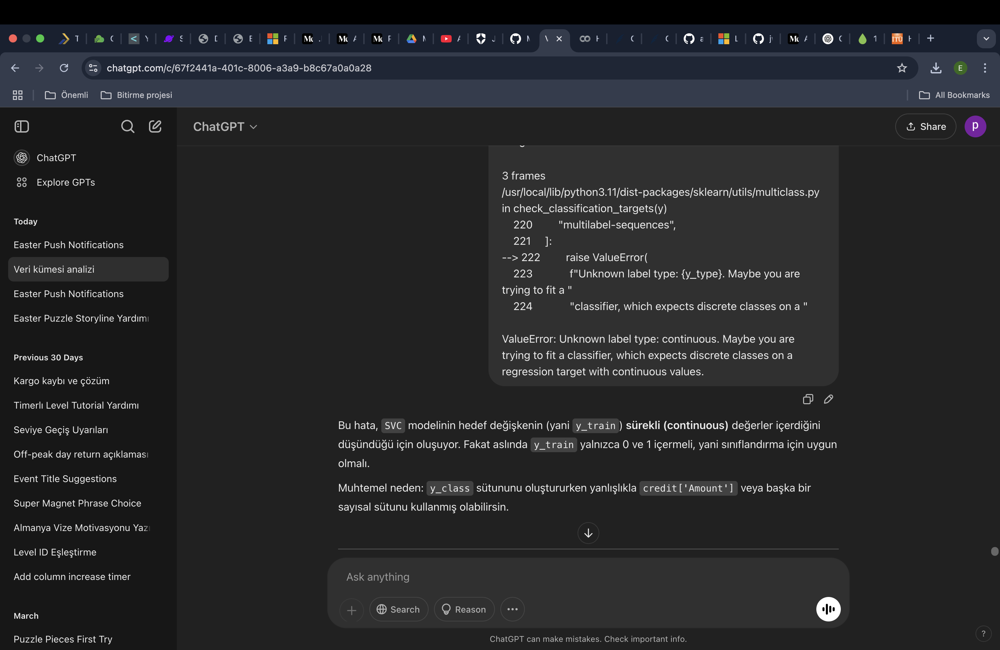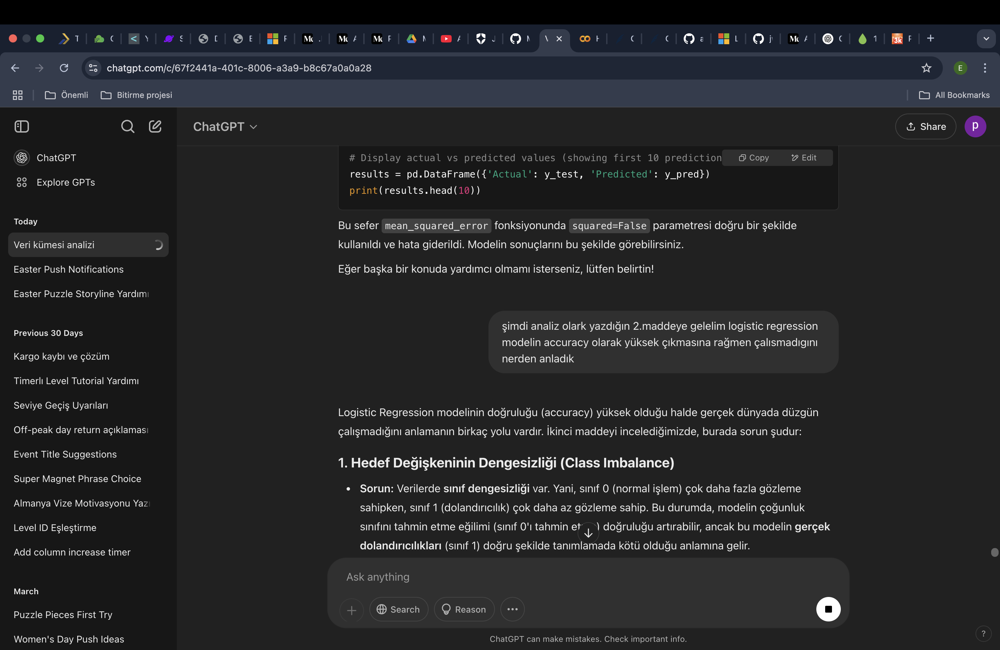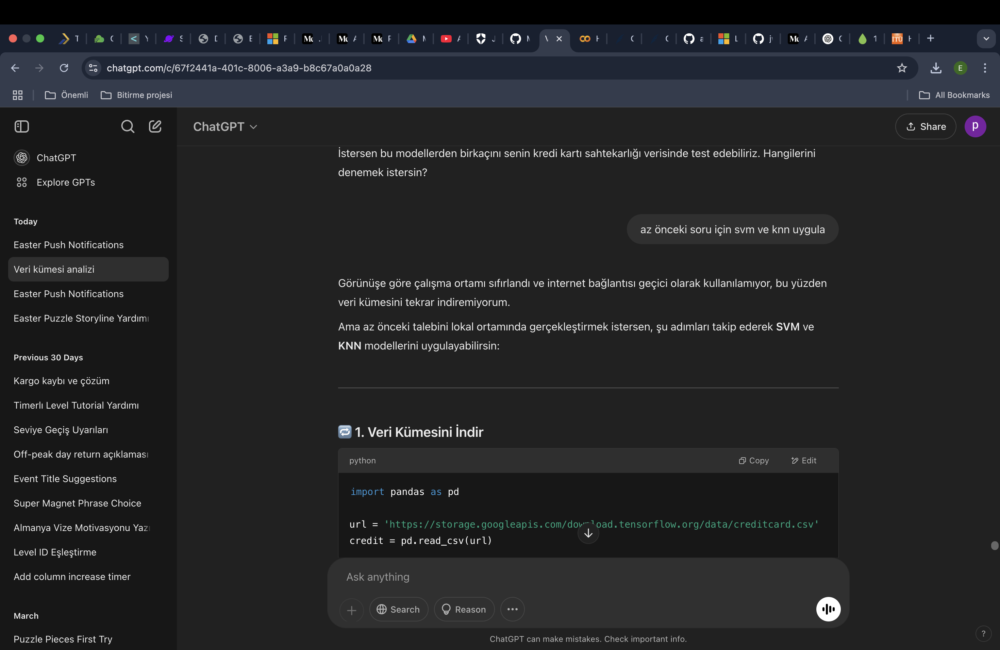